In [272]:
import time

start_time = time.time()

from string import punctuation
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.stem.snowball import SnowballStemmer
import nltk
import re
import string
import numpy as np
import spacy
import pandas as pd
from fuzzywuzzy import fuzz
from nltk.corpus import stopwords
import heapq
import yaml
from nltk.stem import WordNetLemmatizer, PorterStemmer

from transformers import AutoTokenizer, AutoModelForSequenceClassification, AutoConfig
from scipy.special import softmax
import numpy as np
from array import array
import copy

nlp = spacy.load('en_core_web_lg')

nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')

df = pd.read_csv('./scraper/archive/javascript.csv', names=["POSTID", "POSTLINK", "POSTTITLE", "POSTBODY", "POSTDATE", "POSTVOTECOUNTS", "COMMENTID", "COMMENTSCORE", "COMMENTUSERNAME", "COMMENTTEXT", "COMMENTDATETIME", "ANSWERID", "ANSWERTEXT", "ANSWERBODY", "ANSWERDATETIME", "ANSWERVOTECOUNTS", "ANSWERCMTID", "ANSWERCMTTEXT", "ANSWERCMTBODY", "ANSWERCMTDATETIME", "ANSWERCMTVOTECOUNTS" , "TYPE"])

print(df.shape)
display(df.head())

print("\n")
print("All Columns DF")
df.columns

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\User\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


(101724, 22)


,POSTID,POSTLINK,POSTTITLE,POSTBODY,POSTDATE,POSTVOTECOUNTS,COMMENTID,COMMENTSCORE,COMMENTUSERNAME,COMMENTTEXT,...,ANSWERTEXT,ANSWERBODY,ANSWERDATETIME,ANSWERVOTECOUNTS,ANSWERCMTID,ANSWERCMTTEXT,ANSWERCMTBODY,ANSWERCMTDATETIME,ANSWERCMTVOTECOUNTS,TYPE
0,76144358,https://stackoverflow.com/questions/76144358/i...,I'm creating a color blender using Adobe Anima...,\n \n<p>I'm using Adobe Animate...,"('2023-05-01 01:47:04Z',)","('-1',)",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,post
1,36280818,https://stackoverflow.com/questions/36280818/h...,How to convert file to base64 in JavaScript?,\n \n<p><strong>UPD</strong> Ty...,"('2016-03-29 09:49:26Z',)","('355',)",NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,post
2,36280818,https://stackoverflow.com/questions/36280818/h...,How to convert file to base64 in JavaScript?,\n \n<p><strong>UPD</strong> Ty...,"('2016-03-29 09:49:26Z',)","('355',)",NaN,NaN,NaN,NaN,...,Try the solution using the FileReader class:\n...,('\n<p>Try the solution using the <code>FileRe...,"2017-06-09 19:16:52Z, License: CC BY-SA 3.0","('429',)",NaN,NaN,NaN,NaN,NaN,answer
3,36280818,https://stackoverflow.com/questions/36280818/h...,How to convert file to base64 in JavaScript?,\n \n<p><strong>UPD</strong> Ty...,"('2016-03-29 09:49:26Z',)","('355',)",NaN,NaN,NaN,NaN,...,Try the solution using the FileReader class:\n...,('\n<p>Try the solution using the <code>FileRe...,"2017-06-09 19:16:52Z, License: CC BY-SA 3.0","('429',)","('75927236',)",read more about FileReader API: developer.mozi...,('\n \n <span cl...,"Jun 9, 2017 at 19:16","('3',)",answer_comment
4,36280818,https://stackoverflow.com/questions/36280818/h...,How to convert file to base64 in JavaScript?,\n \n<p><strong>UPD</strong> Ty...,"('2016-03-29 09:49:26Z',)","('355',)",NaN,NaN,NaN,NaN,...,Try the solution using the FileReader class:\n...,('\n<p>Try the solution using the <code>FileRe...,"2017-06-09 19:16:52Z, License: CC BY-SA 3.0","('429',)","('81338095',)",I tried to use return reader.result from the g...,('\n \n <span cl...,"Nov 9, 2017 at 5:35","('20',)",answer_comment




All Columns DF


Index(['POSTID', 'POSTLINK', 'POSTTITLE', 'POSTBODY', 'POSTDATE',
       'POSTVOTECOUNTS', 'COMMENTID', 'COMMENTSCORE', 'COMMENTUSERNAME',
       'COMMENTTEXT', 'COMMENTDATETIME', 'ANSWERID', 'ANSWERTEXT',
       'ANSWERBODY', 'ANSWERDATETIME', 'ANSWERVOTECOUNTS', 'ANSWERCMTID',
       'ANSWERCMTTEXT', 'ANSWERCMTBODY', 'ANSWERCMTDATETIME',
       'ANSWERCMTVOTECOUNTS', 'TYPE'],
      dtype='object')

In [273]:
ALL_COLS = ["POSTID", "POSTLINK", "POSTTITLE", "POSTBODY", "POSTDATE", "POSTVOTECOUNTS", "COMMENTID", "COMMENTSCORE", "COMMENTUSERNAME", "COMMENTTEXT", "COMMENTDATETIME", "ANSWERID", "ANSWERTEXT", "ANSWERBODY", "ANSWERDATETIME", "ANSWERVOTECOUNTS", "ANSWERCMTID", "ANSWERCMTTEXT", "ANSWERCMTBODY", "ANSWERCMTDATETIME", "ANSWERCMTVOTECOUNTS" , "TYPE"]

dPOST  = pd.DataFrame(columns=ALL_COLS)
dPOST = df.copy();
dPOST = dPOST.drop(columns=['COMMENTID', 'COMMENTSCORE', 'COMMENTUSERNAME', 'COMMENTTEXT', 'COMMENTDATETIME', 'ANSWERID', 'ANSWERTEXT', 'ANSWERBODY', 'ANSWERDATETIME', 'ANSWERVOTECOUNTS', 'ANSWERCMTID', 'ANSWERCMTTEXT', 'ANSWERCMTBODY', 'ANSWERCMTDATETIME', 'ANSWERCMTVOTECOUNTS'])
# drop if type is not post
dPOST = dPOST[dPOST['TYPE'] == 'post']
display(dPOST.head(3))

dfPC = pd.DataFrame(columns=ALL_COLS)
dfPC = df.copy();
dfPC = dfPC.drop(columns=['ANSWERID', 'ANSWERTEXT', 'ANSWERBODY', 'ANSWERDATETIME', 'ANSWERVOTECOUNTS', 'ANSWERCMTID', 'ANSWERCMTTEXT', 'ANSWERCMTBODY', 'ANSWERCMTDATETIME', 'ANSWERCMTVOTECOUNTS'])
# drop if type is not post
dfPC = dfPC[dfPC['TYPE'] == 'post_comment']
display(dfPC.head(3))

dfA = pd.DataFrame(columns=ALL_COLS)
dfA = df.copy();
dfA = dfA.drop(columns=['POSTLINK', 'POSTBODY', 'POSTDATE', 'POSTVOTECOUNTS', 'COMMENTID', 'COMMENTSCORE', 'COMMENTUSERNAME', 'COMMENTTEXT', 'COMMENTDATETIME', 'ANSWERCMTID', 'ANSWERCMTTEXT', 'ANSWERCMTBODY', 'ANSWERCMTDATETIME', 'ANSWERCMTVOTECOUNTS'])

dfAAC = dfA[dfA['TYPE'] == 'answer']
display(dfAAC.head(3))

dFAC = pd.DataFrame(columns=ALL_COLS)
dFAC = df.copy();
dFAC = dFAC.drop(columns=['POSTLINK', 'POSTBODY', 'POSTDATE', 'POSTVOTECOUNTS', 'COMMENTID', 'COMMENTSCORE', 'COMMENTUSERNAME', 'COMMENTTEXT', 'COMMENTDATETIME', 'ANSWERTEXT', 'ANSWERBODY', 'ANSWERDATETIME', 'ANSWERVOTECOUNTS'])
dFACT = dFAC[dFAC['TYPE'] == 'answer_comment']
display(dFACT.head(3))

print("Post DF")
print(dPOST.columns)
print('\n')

print("Post Comment DF")
print(dfPC.columns)
print('\n')

print("Answer DF")
print(dfAAC.columns)
print('\n')

print("Answer Comment DF")
print(dFACT.columns)
print('\n')

,POSTID,POSTLINK,POSTTITLE,POSTBODY,POSTDATE,POSTVOTECOUNTS,TYPE
0,76144358,https://stackoverflow.com/questions/76144358/i...,I'm creating a color blender using Adobe Anima...,\n \n<p>I'm using Adobe Animate...,"('2023-05-01 01:47:04Z',)","('-1',)",post
1,36280818,https://stackoverflow.com/questions/36280818/h...,How to convert file to base64 in JavaScript?,\n \n<p><strong>UPD</strong> Ty...,"('2016-03-29 09:49:26Z',)","('355',)",post
35,76143948,https://stackoverflow.com/questions/76143948/r...,Resize with JavaScript (JQuery),\n \n<p>I want to resize multip...,"('2023-04-30 23:07:53Z',)","('1',)",post


,POSTID,POSTLINK,POSTTITLE,POSTBODY,POSTDATE,POSTVOTECOUNTS,COMMENTID,COMMENTSCORE,COMMENTUSERNAME,COMMENTTEXT,COMMENTDATETIME,TYPE
36,76143948,https://stackoverflow.com/questions/76143948/r...,Resize with JavaScript (JQuery),\n \n<p>I want to resize multip...,"('2023-04-30 23:07:53Z',)","('1',)",comment-134283400,NaN,disinfor,I updated my answer a bit to give another exam...,"2023-05-01 01:21:53Z, License: CC BY-SA 4.0",post_comment
43,76144135,https://stackoverflow.com/questions/76144135/j...,"JavaScript Rock Paper Scissors Game, alert fun...",\n \n<p>I am attempting to make...,"('2023-05-01 00:14:46Z',)","('1',)",comment-134283077,3.0,Unmitigated,You need <code>let Humanity = 0; let AI = 0;</...,"2023-05-01 00:17:01Z, License: CC BY-SA 4.0",post_comment
44,76144135,https://stackoverflow.com/questions/76144135/j...,"JavaScript Rock Paper Scissors Game, alert fun...",\n \n<p>I am attempting to make...,"('2023-05-01 00:14:46Z',)","('1',)",comment-134283099,NaN,Orifjon,Did you check console for error message?,"2023-05-01 00:18:57Z, License: CC BY-SA 4.0",post_comment


,POSTID,POSTTITLE,ANSWERID,ANSWERTEXT,ANSWERBODY,ANSWERDATETIME,ANSWERVOTECOUNTS,TYPE
2,36280818,How to convert file to base64 in JavaScript?,36281449.0,Try the solution using the FileReader class:\n...,('\n<p>Try the solution using the <code>FileRe...,"2017-06-09 19:16:52Z, License: CC BY-SA 3.0","('429',)",answer
8,36280818,How to convert file to base64 in JavaScript?,57272491.0,Modern ES6 way (async/await)\nconst toBase64 =...,('\n<p><strong>Modern ES6 way</strong> (async/...,"2020-02-20 00:30:24Z, License: CC BY-SA 4.0","('400',)",answer
14,36280818,How to convert file to base64 in JavaScript?,46639837.0,"If you're after a promise-based solution, this...",('\n<p>If you\'re after a promise-based soluti...,"2018-04-26 08:16:38Z, License: CC BY-SA 3.0","('161',)",answer


,POSTID,POSTTITLE,ANSWERID,ANSWERCMTID,ANSWERCMTTEXT,ANSWERCMTBODY,ANSWERCMTDATETIME,ANSWERCMTVOTECOUNTS,TYPE
3,36280818,How to convert file to base64 in JavaScript?,36281449.0,"('75927236',)",read more about FileReader API: developer.mozi...,('\n \n <span cl...,"Jun 9, 2017 at 19:16","('3',)",answer_comment
4,36280818,How to convert file to base64 in JavaScript?,36281449.0,"('81338095',)",I tried to use return reader.result from the g...,('\n \n <span cl...,"Nov 9, 2017 at 5:35","('20',)",answer_comment
5,36280818,How to convert file to base64 in JavaScript?,36281449.0,"('81381618',)",I made a question out of the above comment if ...,('\n \n <span cl...,"Nov 10, 2017 at 5:21","('2',)",answer_comment


Post DF
Index(['POSTID', 'POSTLINK', 'POSTTITLE', 'POSTBODY', 'POSTDATE',
       'POSTVOTECOUNTS', 'TYPE'],
      dtype='object')


Post Comment DF
Index(['POSTID', 'POSTLINK', 'POSTTITLE', 'POSTBODY', 'POSTDATE',
       'POSTVOTECOUNTS', 'COMMENTID', 'COMMENTSCORE', 'COMMENTUSERNAME',
       'COMMENTTEXT', 'COMMENTDATETIME', 'TYPE'],
      dtype='object')


Answer DF
Index(['POSTID', 'POSTTITLE', 'ANSWERID', 'ANSWERTEXT', 'ANSWERBODY',
       'ANSWERDATETIME', 'ANSWERVOTECOUNTS', 'TYPE'],
      dtype='object')


Answer Comment DF
Index(['POSTID', 'POSTTITLE', 'ANSWERID', 'ANSWERCMTID', 'ANSWERCMTTEXT',
       'ANSWERCMTBODY', 'ANSWERCMTDATETIME', 'ANSWERCMTVOTECOUNTS', 'TYPE'],
      dtype='object')




# Explanatory Analysis

#### Clean out noisy values

In [274]:
import warnings
warnings.filterwarnings('ignore')

dPOST['POSTVOTECOUNTS'] = dPOST['POSTVOTECOUNTS'].str.replace(r"(", '')
dPOST['POSTVOTECOUNTS'] = dPOST['POSTVOTECOUNTS'].str.replace(r")", '')
dPOST['POSTVOTECOUNTS'] = dPOST['POSTVOTECOUNTS'].str.replace(r"'", '')
dPOST['POSTVOTECOUNTS'] = dPOST['POSTVOTECOUNTS'].str.replace(r",", '')

dPOST['POSTDATE'] = dPOST['POSTDATE'].str.replace(r"(", '')
dPOST['POSTDATE'] = dPOST['POSTDATE'].str.replace(r")", '')
dPOST['POSTDATE'] = dPOST['POSTDATE'].str.replace(r"'", '')
dPOST['POSTDATE'] = dPOST['POSTDATE'].str.replace(r",", '')
display(dPOST.head(1))

dfPC['POSTVOTECOUNTS'] = dfPC['POSTVOTECOUNTS'].str.replace(r"(", '')
dfPC['POSTVOTECOUNTS'] = dfPC['POSTVOTECOUNTS'].str.replace(r")", '')
dfPC['POSTVOTECOUNTS'] = dfPC['POSTVOTECOUNTS'].str.replace(r"'", '')
dfPC['POSTVOTECOUNTS'] = dfPC['POSTVOTECOUNTS'].str.replace(r",", '')

dfPC['POSTDATE'] = dfPC['POSTDATE'].str.replace(r"(", '')
dfPC['POSTDATE'] = dfPC['POSTDATE'].str.replace(r")", '')
dfPC['POSTDATE'] = dfPC['POSTDATE'].str.replace(r"'", '')
dfPC['POSTDATE'] = dfPC['POSTDATE'].str.replace(r",", '')
dfPC['POSTDATE'] = dfPC['POSTDATE'].str.replace(r",", '')
dfPC['COMMENTDATETIME'] = dfPC['COMMENTDATETIME'].str.replace(r", License: CC BY-SA 4.0", '')
dfPC['COMMENTUSERNAME'] = dfPC['COMMENTUSERNAME'].str.replace(r"segFault", " ")
display(dfPC.head(1))

dfAAC['ANSWERVOTECOUNTS'] = dfAAC['ANSWERVOTECOUNTS'].str.replace(r"(", '')
dfAAC['ANSWERVOTECOUNTS'] = dfAAC['ANSWERVOTECOUNTS'].str.replace(r")", '')
dfAAC['ANSWERVOTECOUNTS'] = dfAAC['ANSWERVOTECOUNTS'].str.replace(r"'", '')
dfAAC['ANSWERVOTECOUNTS'] = dfAAC['ANSWERVOTECOUNTS'].str.replace(r",", '')

dfAAC['ANSWERDATETIME'] = dfAAC['ANSWERDATETIME'].str.replace(r", License: CC BY-SA 4.0", '')
display(dfAAC.head(1))

dFACT['ANSWERCMTVOTECOUNTS'] = dFACT['ANSWERCMTVOTECOUNTS'].str.replace(r"(", '')
dFACT['ANSWERCMTVOTECOUNTS'] = dFACT['ANSWERCMTVOTECOUNTS'].str.replace(r")", '')
dFACT['ANSWERCMTVOTECOUNTS'] = dFACT['ANSWERCMTVOTECOUNTS'].str.replace(r"'", '')
dFACT['ANSWERCMTVOTECOUNTS'] = dFACT['ANSWERCMTVOTECOUNTS'].str.replace(r",", '')

dFACT['ANSWERCMTID'] = dFACT['ANSWERCMTID'].str.replace(r"(", '')
dFACT['ANSWERCMTID'] = dFACT['ANSWERCMTID'].str.replace(r")", '')
dFACT['ANSWERCMTID'] = dFACT['ANSWERCMTID'].str.replace(r"'", '')
dFACT['ANSWERCMTID'] = dFACT['ANSWERCMTID'].str.replace(r",", '')
display(dFACT.head(1))

,POSTID,POSTLINK,POSTTITLE,POSTBODY,POSTDATE,POSTVOTECOUNTS,TYPE
0,76144358,https://stackoverflow.com/questions/76144358/i...,I'm creating a color blender using Adobe Anima...,\n \n<p>I'm using Adobe Animate...,2023-05-01 01:47:04Z,-1,post


,POSTID,POSTLINK,POSTTITLE,POSTBODY,POSTDATE,POSTVOTECOUNTS,COMMENTID,COMMENTSCORE,COMMENTUSERNAME,COMMENTTEXT,COMMENTDATETIME,TYPE
36,76143948,https://stackoverflow.com/questions/76143948/r...,Resize with JavaScript (JQuery),\n \n<p>I want to resize multip...,2023-04-30 23:07:53Z,1,comment-134283400,NaN,disinfor,I updated my answer a bit to give another exam...,2023-05-01 01:21:53Z,post_comment


,POSTID,POSTTITLE,ANSWERID,ANSWERTEXT,ANSWERBODY,ANSWERDATETIME,ANSWERVOTECOUNTS,TYPE
2,36280818,How to convert file to base64 in JavaScript?,36281449.0,Try the solution using the FileReader class:\n...,('\n<p>Try the solution using the <code>FileRe...,"2017-06-09 19:16:52Z, License: CC BY-SA 3.0",429,answer


,POSTID,POSTTITLE,ANSWERID,ANSWERCMTID,ANSWERCMTTEXT,ANSWERCMTBODY,ANSWERCMTDATETIME,ANSWERCMTVOTECOUNTS,TYPE
3,36280818,How to convert file to base64 in JavaScript?,36281449.0,75927236,read more about FileReader API: developer.mozi...,('\n \n <span cl...,"Jun 9, 2017 at 19:16",3,answer_comment


#### Handle Missing Values

In [275]:
# transform empty values to NaN
dPOST = dPOST.replace(r'^\s*$', np.nan, regex=True)
dfPC = dfPC.replace(r'^\s*$', np.nan, regex=True)
dfAAC = dfAAC.replace(r'^\s*$', np.nan, regex=True)
dFACT = dFACT.replace(r'^\s*$', np.nan, regex=True)

display(dPOST.head(1))
display(dfPC.head(1))
display(dfAAC.head(1))
display(dFACT.head(1))

,POSTID,POSTLINK,POSTTITLE,POSTBODY,POSTDATE,POSTVOTECOUNTS,TYPE
0,76144358,https://stackoverflow.com/questions/76144358/i...,I'm creating a color blender using Adobe Anima...,\n \n<p>I'm using Adobe Animate...,2023-05-01 01:47:04Z,-1,post


,POSTID,POSTLINK,POSTTITLE,POSTBODY,POSTDATE,POSTVOTECOUNTS,COMMENTID,COMMENTSCORE,COMMENTUSERNAME,COMMENTTEXT,COMMENTDATETIME,TYPE
36,76143948,https://stackoverflow.com/questions/76143948/r...,Resize with JavaScript (JQuery),\n \n<p>I want to resize multip...,2023-04-30 23:07:53Z,1,comment-134283400,NaN,disinfor,I updated my answer a bit to give another exam...,2023-05-01 01:21:53Z,post_comment


,POSTID,POSTTITLE,ANSWERID,ANSWERTEXT,ANSWERBODY,ANSWERDATETIME,ANSWERVOTECOUNTS,TYPE
2,36280818,How to convert file to base64 in JavaScript?,36281449.0,Try the solution using the FileReader class:\n...,('\n<p>Try the solution using the <code>FileRe...,"2017-06-09 19:16:52Z, License: CC BY-SA 3.0",429,answer


,POSTID,POSTTITLE,ANSWERID,ANSWERCMTID,ANSWERCMTTEXT,ANSWERCMTBODY,ANSWERCMTDATETIME,ANSWERCMTVOTECOUNTS,TYPE
3,36280818,How to convert file to base64 in JavaScript?,36281449.0,75927236,read more about FileReader API: developer.mozi...,('\n \n <span cl...,"Jun 9, 2017 at 19:16",3,answer_comment


<Axes: >

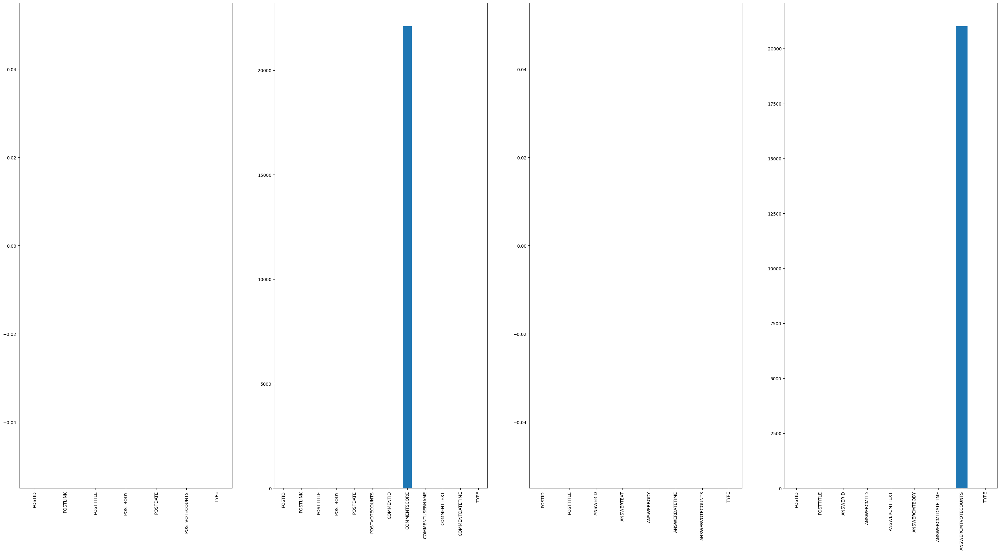

In [276]:
import matplotlib.pyplot as plt
import seaborn as sns
fig, axs = plt.subplots(1, 4, figsize=(40, 20))
dPOST.isna().sum().plot(kind='bar', ax=axs[0])
dfPC.isna().sum().plot(kind='bar', ax=axs[1])
dfAAC.isna().sum().plot(kind='bar', ax=axs[2])
dFACT.isna().sum().plot(kind='bar', ax=axs[3])

In [277]:
# replace nan values to 0 
dfPC = dfPC.fillna(0)
dFACT = dFACT.fillna(0)

display(dPOST.head(1))
display(dfPC.head(1))
display(dfAAC.head(1))
display(dFACT.head(1))

,POSTID,POSTLINK,POSTTITLE,POSTBODY,POSTDATE,POSTVOTECOUNTS,TYPE
0,76144358,https://stackoverflow.com/questions/76144358/i...,I'm creating a color blender using Adobe Anima...,\n \n<p>I'm using Adobe Animate...,2023-05-01 01:47:04Z,-1,post


,POSTID,POSTLINK,POSTTITLE,POSTBODY,POSTDATE,POSTVOTECOUNTS,COMMENTID,COMMENTSCORE,COMMENTUSERNAME,COMMENTTEXT,COMMENTDATETIME,TYPE
36,76143948,https://stackoverflow.com/questions/76143948/r...,Resize with JavaScript (JQuery),\n \n<p>I want to resize multip...,2023-04-30 23:07:53Z,1,comment-134283400,0.0,disinfor,I updated my answer a bit to give another exam...,2023-05-01 01:21:53Z,post_comment


,POSTID,POSTTITLE,ANSWERID,ANSWERTEXT,ANSWERBODY,ANSWERDATETIME,ANSWERVOTECOUNTS,TYPE
2,36280818,How to convert file to base64 in JavaScript?,36281449.0,Try the solution using the FileReader class:\n...,('\n<p>Try the solution using the <code>FileRe...,"2017-06-09 19:16:52Z, License: CC BY-SA 3.0",429,answer


,POSTID,POSTTITLE,ANSWERID,ANSWERCMTID,ANSWERCMTTEXT,ANSWERCMTBODY,ANSWERCMTDATETIME,ANSWERCMTVOTECOUNTS,TYPE
3,36280818,How to convert file to base64 in JavaScript?,36281449.0,75927236,read more about FileReader API: developer.mozi...,('\n \n <span cl...,"Jun 9, 2017 at 19:16",3,answer_comment


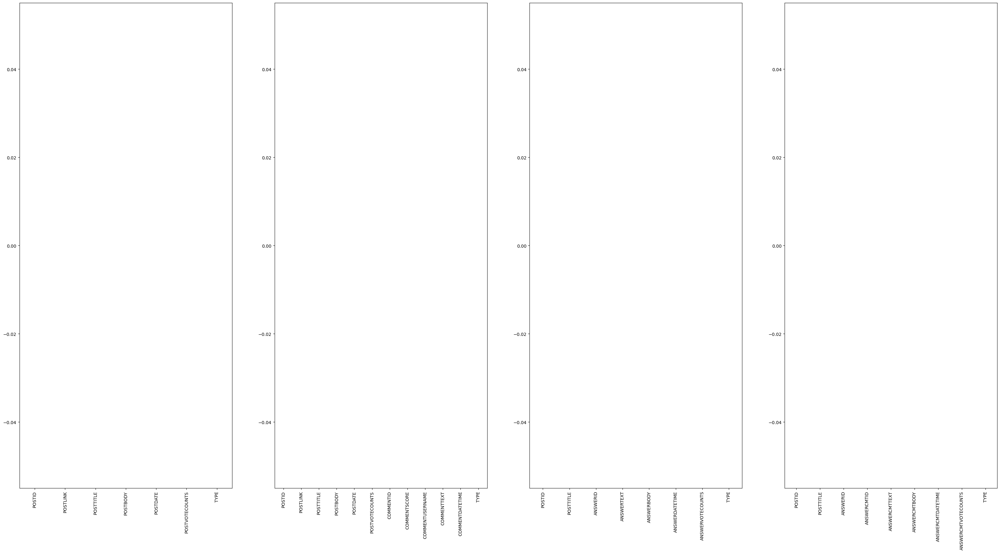

In [278]:
fig, axs = plt.subplots(1, 4, figsize=(40, 20))
dPOST.isna().sum().plot(kind='bar', ax=axs[0])
dfPC.isna().sum().plot(kind='bar' , ax=axs[1])
dfAAC.isna().sum().plot(kind='bar', ax=axs[2])
dFACT.isna().sum().plot(kind='bar', ax=axs[3])
plt.show()

<Axes: xlabel='ANSWERCMTVOTECOUNTS', ylabel='Density'>

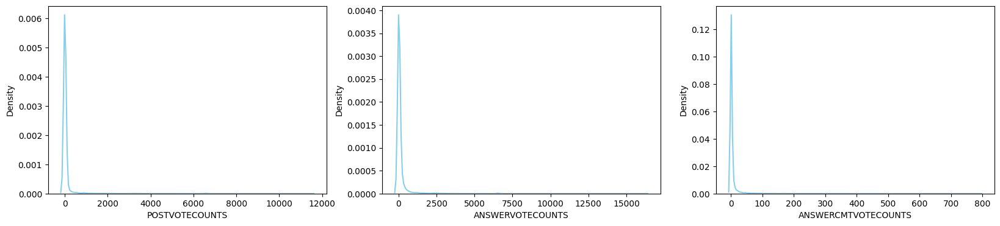

In [279]:
# show vote count distribution
fig, axs = plt.subplots(1, 3, figsize=(20, 4))
sns.distplot(dPOST['POSTVOTECOUNTS'] , color="skyblue", ax=axs[0], bins=range(0, 10, 20))
sns.distplot(dfAAC['ANSWERVOTECOUNTS'] , color="skyblue", ax=axs[1], bins=range(0, 10, 20))
sns.distplot(dFACT['ANSWERCMTVOTECOUNTS'] , color="skyblue", ax=axs[2], bins=range(0, 10, 20))
# specify range 

In [280]:
# reset warnings
warnings.resetwarnings()

# Beginning of Idea A

### 1. String similarity to find related post

In [281]:
unique_values = df['POSTTITLE'].unique()
print("There are a total of {} unique titles".format(len(unique_values)))

# query = 'Reverse binary tree'
query = 'convert date to string'
# query 1 = 'Useeffect hook rerenders infinitely'
# query 2 = 'Fetching data - useEffect hook'
# query 3 = 'How to use the useEffect hook?'
# query 4 = "useEffect hook doesn't work"
# query 5 = "Use effect hook with use state"

There are a total of 16262 unique titles


#### 1.1 Fuzzy Wuzzy

In [282]:
def calPartialRatio (str1, str2):
    return fuzz.partial_ratio(str1, str2)

def calTokenSortRatio (str1, str2):
    return fuzz.token_sort_ratio(str1, str2)

fuzzywuzzy_df = pd.DataFrame(columns=['postId', 'title', 'partial_ratio', 'token_sort_ratio'])
for unique_value in unique_values:
    # find the postId of the unique value
    postId = df[df['POSTTITLE'] == unique_value]['POSTID'].tolist()[0]
    fuzzywuzzy_df = pd.concat([fuzzywuzzy_df, pd.DataFrame({'postId': postId , 'title': unique_value, 'partial_ratio': calPartialRatio(unique_value, query), 'token_sort_ratio': calTokenSortRatio(unique_value, query)}, index=[0])], )

matchesPR = fuzzywuzzy_df.sort_values(by=['partial_ratio'], ascending=False)
matchesPR = matchesPR[matchesPR['partial_ratio'] > 50]

matchesTS = fuzzywuzzy_df.sort_values(by=['token_sort_ratio'], ascending=False)
matchesTS = matchesTS[matchesTS['token_sort_ratio'] > 50]

Top10MathesMerged = pd.concat([matchesTS, matchesPR]).drop_duplicates()
Top10MathesMerged['average'] = (Top10MathesMerged['token_sort_ratio'] + Top10MathesMerged['partial_ratio']) / 2
Top10MathesMerged = Top10MathesMerged.sort_values(by=['average'], ascending=False)


Top10MathesMerged = Top10MathesMerged[Top10MathesMerged['average'] > 50]
display(Top10MathesMerged)
print("{} number of titles found".format(len(Top10MathesMerged)))

,postId,title,partial_ratio,token_sort_ratio,average
0,74287738,Convert date to string in JavaScript,95,76,85.5
0,6356519,Convert date from string in javascript,86,63,74.5
0,5914020,javascript date to string,86,60,73.0
0,13707333,Javascript Convert Date Time string to Epoch,77,67,72.0
0,74320956,Javascript - convert array to stringify format...,82,58,70.0
...,...,...,...,...,...
0,75244202,I am using javascript to convert a large table...,59,42,50.5
0,75478926,Convert PNG image binary string to base64 with...,55,46,50.5
0,75240867,Function to title case a string using javascript,55,46,50.5
0,75642121,Find the Longest Word in a String in javascript,55,46,50.5


300 number of titles found


#### 1.2 Bag of words approach (https://stackoverflow.com/questions/51623595/better-approach-than-fuzzywuzzy)

In [283]:
# bag_words_df = pd.DataFrame(columns=['postId', 'title', 'score'])

# def myScore(lst1, lst2):
#     c = sum(el in lst1 for el in lst2)
#     if (len(lst1) == 0 or len(lst2) == 0):
#         retval = 0.0
#     else:
#         retval = 0.5 * (c/len(lst1) + c/len(lst2))

#     return retval

# query_tokenized = nltk.word_tokenize(query)

# for unique_value in unique_values:
#     postId = df[df['POSTTITLE'] == unique_value]['POSTID'].tolist()[0]
#     bag_words_df = pd.concat([bag_words_df, pd.DataFrame({'postId': postId , 'title': unique_value, 'score': myScore(nltk.word_tokenize(unique_value), query_tokenized)}, index=[0])], )

# TopMatchesBOW = bag_words_df.sort_values(by=['score'], ascending=False)
# TopMatchesBOW = TopMatchesBOW[TopMatchesBOW['score'] > 0.5]
# display(TopMatchesBOW)

#### 1.3 Spacy Similarity (https://stackoverflow.com/questions/52113939/spacy-strange-similarity-between-two-sentences)

In [284]:
spacy_sim = pd.DataFrame(columns=['postId', 'title', 'score'])
search_doc_no_stop_words = nlp(query)

for unique_value in unique_values:
    postId = df[df['POSTTITLE'] == unique_value]['POSTID'].tolist()[0]
    spacy_sim = pd.concat([spacy_sim, pd.DataFrame({'postId': postId , 'title': unique_value, 'score': search_doc_no_stop_words.similarity(nlp(unique_value))}, index=[0])], )

TopMatchesSpacy = spacy_sim.sort_values(by=['score'], ascending=False)
TopMatchesSpacy = TopMatchesSpacy[TopMatchesSpacy['score'] > 0.5]

display(TopMatchesSpacy)
print("{} number of titles found".format(len(TopMatchesSpacy)))

,postId,title,score
0,5914020,javascript date to string,0.977097
0,74649530,Indesign Javascript to convert dates,0.939281
0,75218296,Adds month to date javascript with format,0.914588
0,20083807,Javascript date to sql date object,0.910749
0,74802100,convert string to time javascript in order to ...,0.905729
...,...,...,...
0,51828247,How do I match a single word in Javascript Regex?,0.500114
0,74615759,"Can't use ""super.member.Func()"" in javascript....",0.500081
0,46537220,What is wrong in this javascript code about an...,0.500054
0,74408677,Greet User by name using Javascript and query ...,0.500012


11130 number of titles found


After testing, we observed that 
1. If the query is short and abstract, The fuzzy wuzzy method gives us a more accurate score
2. In the contradictary, if the query is long and comprehensive, The spacy similarity method gives a more accurate score

## 2. Group all comments into post

In [285]:
class GroupedComments: 
    def __init__(self, title, post, post_comments, answers, answer_comments): 
        self.title = title
        self.post = post
        self.post_comments = post_comments
        self.answers = answers
        self.answer_comments = answer_comments
        
def grouping(titleArr): 
    grouped = []
    for title in titleArr:
        try:
            post = dPOST[dPOST['POSTTITLE'].str.contains(title)]
            post_comments = dfPC[dfPC['POSTTITLE'].str.contains(title)]
            answers = dfAAC[dfAAC['POSTTITLE'].str.contains(title)]
            answer_comments = dFACT[dFACT['POSTTITLE'].str.contains(title)]
            grouped.append(GroupedComments(title, post, post_comments, answers, answer_comments))
        except Exception as e:
            pass
        
    return grouped 

allcommentsGrouped = grouping(Top10MathesMerged['title'].tolist())

display(allcommentsGrouped[2].post_comments)
display(allcommentsGrouped[2].answers)
display(allcommentsGrouped[2].answer_comments)

C:\Users\User\AppData\Local\Temp\ipykernel_27852\2217727103.py:13: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  post = dPOST[dPOST['POSTTITLE'].str.contains(title)]
C:\Users\User\AppData\Local\Temp\ipykernel_27852\2217727103.py:14: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  post_comments = dfPC[dfPC['POSTTITLE'].str.contains(title)]
C:\Users\User\AppData\Local\Temp\ipykernel_27852\2217727103.py:15: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  answers = dfAAC[dfAAC['POSTTITLE'].str.contains(title)]
C:\Users\User\AppData\Local\Temp\ipykernel_27852\2217727103.py:16: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  answer_comments = dFACT

,POSTID,POSTLINK,POSTTITLE,POSTBODY,POSTDATE,POSTVOTECOUNTS,COMMENTID,COMMENTSCORE,COMMENTUSERNAME,COMMENTTEXT,COMMENTDATETIME,TYPE
49662,5914020,https://stackoverflow.com/questions/5914020/ja...,javascript date to string,\n \n<p>Here is what I need to ...,2011-05-06 16:04:59Z,60,comment-6809418,1.0,Liv,have you looked at this previous one: <a href=...,"2011-05-06 16:07:24Z, License: CC BY-SA 3.0",post_comment
49663,5914020,https://stackoverflow.com/questions/5914020/ja...,javascript date to string,\n \n<p>Here is what I need to ...,2011-05-06 16:04:59Z,60,comment-19250671,1.0,Nate Barr,"For reference, here is a definitive source: <a...","2012-12-19 16:41:25Z, License: CC BY-SA 3.0",post_comment


,POSTID,POSTTITLE,ANSWERID,ANSWERTEXT,ANSWERBODY,ANSWERDATETIME,ANSWERVOTECOUNTS,TYPE


,POSTID,POSTTITLE,ANSWERID,ANSWERCMTID,ANSWERCMTTEXT,ANSWERCMTBODY,ANSWERCMTDATETIME,ANSWERCMTVOTECOUNTS,TYPE


In [286]:
allCommentsGroupedCleanedDict = {}
for idx, item in enumerate(allcommentsGrouped):
    comments = []
    answers = []
    answers_cmts = []
    
    if (item.post_comments['COMMENTTEXT'].shape[0] > 0):
      for (index, comment) in item.post_comments['COMMENTTEXT'].items():
        comment_idx = item.post_comments[item.post_comments['COMMENTTEXT'] == comment]['COMMENTID'].tolist()[0]
        comment_votes = item.post_comments[item.post_comments['COMMENTTEXT'] == comment]['COMMENTSCORE'].tolist()[0]
        comment_dt = item.post_comments[item.post_comments['COMMENTTEXT'] == comment]['COMMENTDATETIME'].tolist()[0]
        if str(comment) != 'nan':
          comments.append({
            "comment": comment, 
            "id": comment_idx,
            "votes": comment_votes,
            "datetime": comment_dt
          })
    comments_joined = ' '.join([str(elem['comment']) for elem in comments])

    if (item.answers['ANSWERBODY'].shape[0] > 0):
      for (index, answer) in item.answers['ANSWERBODY'].items():
        answer_idx = item.answers[item.answers['ANSWERBODY'] == answer]['ANSWERID'].tolist()[0]
        answer_votes = item.answers[item.answers['ANSWERBODY'] == answer]['ANSWERVOTECOUNTS'].tolist()[0]
        answer_dt = item.answers[item.answers['ANSWERBODY'] == answer]['ANSWERDATETIME'].tolist()[0]
        if str(answer) != 'nan':
          answers.append({
            "answer": answer,
            "id": answer_idx,
            "votes": answer_votes,
            "datetime": answer_dt
          })
        
    answers_joined = ' '.join([str(elem['answer']) for elem in answers])
    
    for (index, answer_cmt) in item.answer_comments['ANSWERCMTBODY'].items():
      answer_cmt_idx = item.answer_comments[item.answer_comments['ANSWERCMTBODY'] == answer_cmt]['ANSWERCMTID'].tolist()[0]
      answer_cmt_votes = item.answer_comments[item.answer_comments['ANSWERCMTBODY'] == answer_cmt]['ANSWERCMTVOTECOUNTS'].tolist()[0]
      answer_cmt_dt = item.answer_comments[item.answer_comments['ANSWERCMTBODY'] == answer_cmt]['ANSWERCMTDATETIME'].tolist()[0]
      if str(answer_cmt) != 'nan':
        answers_cmts.append({
          "answer_cmt": answer_cmt,
          "id": 1,
          "votes": answer_cmt_votes,
          "datetime": answer_cmt_dt
        })
        
    answers_cmts_joined = ' '.join([str(elem['answer_cmt']) for elem in answers_cmts])
    
    allCommentsGroupedCleanedDict[item.title] = {
      "comments": comments,
      "answers": answers,
      "answer_comments": answers_cmts,
      "comments_joined": comments_joined,
      "answers_joined": answers_joined,
      "answers_cmts_joined": answers_cmts_joined
    }

print("{} number of post instances".format(len(allCommentsGroupedCleanedDict)))

print(yaml.dump(allCommentsGroupedCleanedDict, allow_unicode=True, default_flow_style=False))

297 number of post instances
Add characters to a string in Javascript:
  answer_comments:
  - answer_cmt: '(''\n                \n                <span class="comment-copy">A
      better way might be to get the keys from the object instead of iterating (<code>for...in</code>),
      and join on those:  <code>var text = ""; text += Object.keys(list).join(\''\'')</code></span>\n                \n                <div
      class="d-inline-flex ai-center">\n–&nbsp;<a href="/users/713026/blazes" title="4,673
      reputation" class="comment-user">Blazes</a>\n                </div>\n                <span
      class="comment-date" dir="ltr"><a class="comment-link" href="#comment106813162_5754754"
      aria-label="Link to comment"><span title="2020-02-24 17:32:23Z, License: CC
      BY-SA 4.0" class="relativetime-clean">Feb 24, 2020 at 17:32</span></a></span>\n                        <span
      title="this comment was edited 9 times">\n                            <svg aria-hidden="true"
  

In [317]:
print(allCommentsGroupedCleanedDict)

{'Convert date to string in JavaScript': {'comments': [{'comment': 'you write javascript in the title, then use the java tag, why? Also I bet there are thousands of questions or tutorials about this topic, have you done any research?', 'id': 'comment-131152898', 'votes': 2.0, 'datetime': '2022-11-02 10:30:56Z', 'url': []}, {'comment': 'mistakenly i give that java tag.', 'id': 'comment-131153081', 'votes': 0.0, 'datetime': '2022-11-02 10:39:30Z', 'url': []}, {'comment': 'i am a new bee to stackoverflow thats why this kind of mistakes i made.', 'id': 'comment-131153097', 'votes': 0.0, 'datetime': '2022-11-02 10:40:20Z', 'url': []}], 'answers': [], 'answer_comments': [], 'comments_joined': 'you write javascript in the title, then use the java tag, why? Also I bet there are thousands of questions or tutorials about this topic, have you done any research? mistakenly i give that java tag. i am a new bee to stackoverflow thats why this kind of mistakes i made.', 'answers_joined': '', 'answers

## 3. Preprocessing

In [287]:
test_text = ('\n<p>You have to convert the response to json <a href="https://google.com">Please Look at this link</a> with await <a href="https://google.com">await</a> response.json();\nand then use setState.</p>\n\n<pre class="lang-js s-code-block"><code class="hljs language-javascript"><span class="hljs-title function_">useEffect</span>(<span class="hljs-function">() =&gt;</span> {         \n        <span class="hljs-variable language_">console</span>.<span class="hljs-title function_">log</span>(<span class="hljs-string">"useEffect TopTen has been called!"</span>);   \n        <span class="hljs-keyword">const</span> <span class="hljs-title function_">fetchdata</span> = <span class="hljs-keyword">async</span> (<span class="hljs-params"></span>) =&gt; {\n        <span class="hljs-keyword">const</span> response = <span class="hljs-keyword">await</span> api.<span class="hljs-title function_">topTen</span>();  <span class="hljs-comment">// this calls axios(url)</span>\n        <span class="hljs-keyword">const</span> responseData = <span class="hljs-keyword">await</span> response.<span class="hljs-title function_">json</span>();\n        <span class="hljs-title function_">setLoading</span>(<span class="hljs-literal">false</span>);\n        <span class="hljs-title function_">setTopten</span>(responseData.<span class="hljs-property">data</span>);    \n        <span class="hljs-title function_">setError</span>(responseData.<span class="hljs-property">error</span>);    \n    };\n\n    fetchdata ();     \n}, []);\n</code></pre>\n    ',)
print(str(test_text))

('\n<p>You have to convert the response to json <a href="https://google.com">Please Look at this link</a> with await <a href="https://google.com">await</a> response.json();\nand then use setState.</p>\n\n<pre class="lang-js s-code-block"><code class="hljs language-javascript"><span class="hljs-title function_">useEffect</span>(<span class="hljs-function">() =&gt;</span> {         \n        <span class="hljs-variable language_">console</span>.<span class="hljs-title function_">log</span>(<span class="hljs-string">"useEffect TopTen has been called!"</span>);   \n        <span class="hljs-keyword">const</span> <span class="hljs-title function_">fetchdata</span> = <span class="hljs-keyword">async</span> (<span class="hljs-params"></span>) =&gt; {\n        <span class="hljs-keyword">const</span> response = <span class="hljs-keyword">await</span> api.<span class="hljs-title function_">topTen</span>();  <span class="hljs-comment">// this calls axios(url)</span>\n        <span class="hljs-keyw

In [288]:
from nltk.corpus import stopwords


stopwords = set(stopwords.words('english'))

#### 3.1 Finding tech related stop words

In [289]:
# adding stopwords to the list
engineering_stop_words=['able','above-mentioned','accordingly','across','along','already','alternatively','always','among','and/or','anything','anywhere','better','disclosure','due','easily','easy','eg','either','elsewhere','enough','especially','essentially','et','al','etc','eventually','excellent','finally','furthermore','good','hence','he/she','him/her','his/her','ie','ii','iii','instead','later','like','little','many','may','meanwhile','might','moreover','much','must','never','often','others','otherwise','overall','rather','remarkably','significantly','simply','sometimes','specifically','straight','forward','substantially','thereafter','therebetween','therefor','therefrom','therein','thereinto+','thereon','therethrough','therewith','together','toward','towards','typical','typically','upon','via','vice','versa','whatever','whereas','whereat','wherever','whether','whose','within','without','yet']
stopwords.update(engineering_stop_words)

print(engineering_stop_words)
print(stopwords)

['able', 'above-mentioned', 'accordingly', 'across', 'along', 'already', 'alternatively', 'always', 'among', 'and/or', 'anything', 'anywhere', 'better', 'disclosure', 'due', 'easily', 'easy', 'eg', 'either', 'elsewhere', 'enough', 'especially', 'essentially', 'et', 'al', 'etc', 'eventually', 'excellent', 'finally', 'furthermore', 'good', 'hence', 'he/she', 'him/her', 'his/her', 'ie', 'ii', 'iii', 'instead', 'later', 'like', 'little', 'many', 'may', 'meanwhile', 'might', 'moreover', 'much', 'must', 'never', 'often', 'others', 'otherwise', 'overall', 'rather', 'remarkably', 'significantly', 'simply', 'sometimes', 'specifically', 'straight', 'forward', 'substantially', 'thereafter', 'therebetween', 'therefor', 'therefrom', 'therein', 'thereinto+', 'thereon', 'therethrough', 'therewith', 'together', 'toward', 'towards', 'typical', 'typically', 'upon', 'via', 'vice', 'versa', 'whatever', 'whereas', 'whereat', 'wherever', 'whether', 'whose', 'within', 'without', 'yet']
{'over', 'a', 'then', 

In [290]:
# translate_table = dict((ord(char), None) for char in punctuation if char not in [' ', '\t', ' ', '\r', ",", ';', '?', '!'])
# translate_table.update(dict((ord(char), None) for char in string.digits))

# # find tech related stop words
# tech_stopwords = set(stopwords.words('english'))

# remove stopwords from the text
temp_text = "Imagine if that was a Web Socket and we were scheduling a new heartbeat tick every time we remounted; the server would be very angry at our apps heart palpitations."
def remove_stopwords(text):
    text = text.lower()
    text = text.split()
    text = [word for word in text if not word in stopwords]
    text = " ".join(text)
    return text
  
# remove stopwords from the text
print(remove_stopwords(temp_text))

imagine web socket scheduling new heartbeat tick every time remounted; server would angry apps heart palpitations.


#### 3.2 Extract url from text

In [291]:
def extractUrl(text):
    # find a tag
    a_tag = re.findall(r'<a.*?href=[\'"](.*?)[\'"].*?>(.*?)</a>', text)
    return a_tag
  
print(extractUrl(str(test_text)))

[('https://google.com', 'Please Look at this link'), ('https://google.com', 'await')]


#### 3.3 Remove code blocks

In [292]:
def removeCodeBlocks(text):
    # remove blocks with classname code-block
    text = re.sub(r'<pre class="code-block">.*?</pre>', '', text, flags=re.DOTALL)
    # remove code tag
    text = re.sub(r'<code>.*?</code>', '', text, flags=re.DOTALL)
    # remove every code tag with class name
    text = re.sub(r'<code class=".*?">.*?</code>', '', text, flags=re.DOTALL)
    return text
  
def removeSpaces(text):
    # remove multiple spaces
    text = re.sub(r'\s+', ' ', text)
    return text
  
def removeslashn(text):
    # remove multiple spaces
    text = re.sub(r'\n\n\n ', ' ', text)
    return text
  


#### 3.4 Remove HTML Tags

In [293]:
def removeHTMLTags(text):
    # remove html tags
    text = re.sub(r'<[^>]*>', '', text)
    return text
  
print(removeHTMLTags(str(test_text)))
print('\n')

print(removeSpaces(str(test_text)))
print('\n')

print(removeslashn(str(test_text)))
print('\n')

print(removeCodeBlocks(str(test_text)))
print('\n')

('\nYou have to convert the response to json Please Look at this link with await await response.json();\nand then use setState.\n\nuseEffect(() =&gt; {         \n        console.log("useEffect TopTen has been called!");   \n        const fetchdata = async () =&gt; {\n        const response = await api.topTen();  // this calls axios(url)\n        const responseData = await response.json();\n        setLoading(false);\n        setTopten(responseData.data);    \n        setError(responseData.error);    \n    };\n\n    fetchdata ();     \n}, []);\n\n    ',)


('\n<p>You have to convert the response to json <a href="https://google.com">Please Look at this link</a> with await <a href="https://google.com">await</a> response.json();\nand then use setState.</p>\n\n<pre class="lang-js s-code-block"><code class="hljs language-javascript"><span class="hljs-title function_">useEffect</span>(<span class="hljs-function">() =&gt;</span> { \n <span class="hljs-variable language_">console</span>.<span c

#### 3.5 Lemmetization

In [294]:
lemmer = WordNetLemmatizer()
stemmer = PorterStemmer()
def lemmatize_stemming(text):
    return stemmer.stem(WordNetLemmatizer().lemmatize(text, pos='v')) 
  
def stemming (text):
    return stemmer.stem(text)

##### 3.5.1 Looking into lemmer vs stemmer

In [295]:
temp_text = "Imagine if that was a Web Socket and we were scheduling a new heartbeat tick every time we remounted; the server would be very angry at our apps heart palpitations."
print("Imagine if that was a Web Socket and we were scheduling a new heartbeat tick every time we remounted; the server would be very angry at our apps heart palpitations. \n")

tokenized_text = word_tokenize(temp_text)
lemmatized_text = " ".join([lemmer.lemmatize(w) for w in tokenized_text])

print(lemmatized_text)
print(" \n")

stemmerized = " ".join([stemmer.stem(w) for w in tokenized_text])

print(stemmerized)
print(" \n")

Imagine if that was a Web Socket and we were scheduling a new heartbeat tick every time we remounted; the server would be very angry at our apps heart palpitations. 

Imagine if that wa a Web Socket and we were scheduling a new heartbeat tick every time we remounted ; the server would be very angry at our apps heart palpitation .
 

imagin if that wa a web socket and we were schedul a new heartbeat tick everi time we remount ; the server would be veri angri at our app heart palpit .
 



#### 3.6 Running the pipeline

#### 3.6.1 Group all processing task

In [296]:
def preprocessText(text):
  text = removeCodeBlocks(text)
  text = removeHTMLTags(text)
  text = re.sub(r'(https?://\S+)', '', text)
  text = text.replace("('", '')
  text = text.replace("',)", '')
  text = re.sub(r"\\n", '', text)
  text = re.sub(r'–&nbsp;', '', text)
  
  # remove empty spaces 
  text = removeSpaces(text)
  
  return text

#### 3.6.2 Testing the processing task

In [297]:
print(" \n")

test_text = preprocessText(str(test_text))
print(test_text)

 

You have to convert the response to json Please Look at this link with await await response.json();and then use setState. 


In [298]:
for key, value in allCommentsGroupedCleanedDict.items():
    allcomments = []
    allanswers = []
    allanswercomments = []
    
    if value['comments']:
      for comment in value['comments']:
        if comment['comment']:
          indi_comment = comment['comment']
          url = extractUrl(indi_comment)
          indi_comment = preprocessText(indi_comment)
          comment['comment'] = indi_comment
          comment['url'] = url
          allcomments.append(indi_comment)

    # processing answers
    if value['answers']:
      for answer in value['answers']:
        if answer['answer']:
          indi_answer = answer['answer']
          url = extractUrl(indi_answer)
          indi_answer = preprocessText(indi_answer)
          indi_answer = lemmatize_stemming(indi_answer)
          answer['answer'] = indi_answer
          answer['url'] = url
          allanswers.append(indi_answer)
          
    # processing answer_comments
    if value['answer_comments']:
      for answer_cmt in value['answer_comments']:
        if answer_cmt['answer_cmt']:
          indi_answer_cmt = answer_cmt['answer_cmt']
          url = extractUrl(indi_answer_cmt)
          indi_answer_cmt = preprocessText(indi_answer_cmt)
          answer_cmt['answer_cmt'] = indi_answer_cmt
          answer_cmt['url'] = url
          allanswercomments.append(indi_answer_cmt)
          
    value['comments_joined'] = ' '.join(allcomments)
    value['answers_joined'] = ' '.join(allanswers)
    value['answers_cmts_joined'] = ' '.join(allanswercomments)
    # replace the value of the key
    allCommentsGroupedCleanedDict[key] = value
    
print(yaml.dump(allCommentsGroupedCleanedDict, allow_unicode=True, default_flow_style=False))

Add characters to a string in Javascript:
  answer_comments:
  - answer_cmt: ' A better way might be to get the keys from the object instead of
      iterating (), and join on those: Blazes Feb 24, 2020 at 17:32 '
    datetime: Feb 24, 2020 at 17:32
    id: 1
    url:
    - !!python/tuple
      - /users/713026/blazes
      - Blazes
    - !!python/tuple
      - '#comment106813162_5754754'
      - '<span title="2020-02-24 17:32:23Z, License: CC BY-SA 4.0" class="relativetime-clean">Feb
        24, 2020 at 17:32</span>'
    votes: '1'
  answers:
  - answer: ' '
    datetime: '2020-02-24 17:32:23Z'
    id: 5754754.0
    url: []
    votes: '189'
  answers_cmts_joined: ' A better way might be to get the keys from the object instead
    of iterating (), and join on those: Blazes Feb 24, 2020 at 17:32 '
  answers_joined: ' '
  comments:
  - comment: 'If list is an array, then don''t use but a normal loop. More information
      here: developer.mozilla.org/en/JavaScript/Reference/Statements/… B

In [318]:
print(allCommentsGroupedCleanedDict)

{'Convert date to string in JavaScript': {'comments': [{'comment': 'you write javascript in the title, then use the java tag, why? Also I bet there are thousands of questions or tutorials about this topic, have you done any research?', 'id': 'comment-131152898', 'votes': 2.0, 'datetime': '2022-11-02 10:30:56Z', 'url': []}, {'comment': 'mistakenly i give that java tag.', 'id': 'comment-131153081', 'votes': 0.0, 'datetime': '2022-11-02 10:39:30Z', 'url': []}, {'comment': 'i am a new bee to stackoverflow thats why this kind of mistakes i made.', 'id': 'comment-131153097', 'votes': 0.0, 'datetime': '2022-11-02 10:40:20Z', 'url': []}], 'answers': [], 'answer_comments': [], 'comments_joined': 'you write javascript in the title, then use the java tag, why? Also I bet there are thousands of questions or tutorials about this topic, have you done any research? mistakenly i give that java tag. i am a new bee to stackoverflow thats why this kind of mistakes i made.', 'answers_joined': '', 'answers

#### 3.5 Stop Words Removal (based on step 1)

In [299]:
# translate_table = dict((ord(char), None) for char in punctuation if char not in [' ', '\t', ' ', '\r', ",", ';', '?', '!'])
# translate_table.update(dict((ord(char), None) for char in string.digits))

# # find tech related stop words
# tech_stopwords = set(stopwords.words('english'))

## 4. Sentence Scoring

In [300]:
from nltk.corpus import stopwords

stopwords = set(stopwords.words('english'))
def frequencyCounting(text, verbose = False):
  translate_table = dict((ord(char), None) for char in punctuation if char not in [' ', '\t', ' ', '\r', ",", ';', '?', '!'])
  translate_table.update(dict((ord(char), None) for char in string.digits))

  compiledCommentsForFirstPost = text.translate(translate_table)

  word_frequencies = {}
  for word in word_tokenize(compiledCommentsForFirstPost):
      word = SnowballStemmer("english").stem(word)
      if word not in stopwords:
          if word not in punctuation:
            if word not in word_frequencies.keys():
                word_frequencies[word] = 1
            else:
                word_frequencies[word] += 1

  maximum_frequncy = max(word_frequencies.values(), default=0)
  for word in word_frequencies.keys():
      word_frequencies[word] = (word_frequencies[word]/maximum_frequncy)
  
  if(verbose):
    print(sorted(word_frequencies.items(), key=lambda x: x[1], reverse=True))

  sentence_list = sent_tokenize(compiledCommentsForFirstPost)
  
  if(verbose):
    print('total sentences: ', len(sentence_list))

  sentence_scores = {}
  for sent in sentence_list:
      sentence = sent.split()
      for word in sentence:        
          if word.lower() in word_frequencies.keys():
              if sent not in sentence_scores.keys():
                  sentence_scores[sent] = word_frequencies[word.lower()]
              else:
                  sentence_scores[sent] += word_frequencies[word.lower()]
                  
  if(verbose):
    print('scores for sentences: ', sorted(sentence_scores.items(), key=lambda x: x[1], reverse=True))
  
  return sentence_scores, sentence_list
  

results = []
for i in range(0, len(allCommentsGroupedCleanedDict)):
  comments_answers_answerscmt = allCommentsGroupedCleanedDict[list(allCommentsGroupedCleanedDict.keys())[i]]['comments_joined'] + ' ' + allCommentsGroupedCleanedDict[list(allCommentsGroupedCleanedDict.keys())[i]]['answers_joined'] + ' ' + allCommentsGroupedCleanedDict[list(allCommentsGroupedCleanedDict.keys())[i]]['answers_cmts_joined']
  
  if(len(comments_answers_answerscmt) > 0):
    sentence_scores, sentence_list = frequencyCounting(comments_answers_answerscmt, verbose=False)
    results.append({
      "title": list(allCommentsGroupedCleanedDict.keys())[i],
      "sentence_scores": sentence_scores,
      "sentence_list": sentence_list
    })
    summary_sentences = heapq.nlargest(5, sentence_scores, key=sentence_scores.get)

for result in results:
  if len(result['sentence_scores']) == 0:
    averageSentenceScore = 0
    result['avg_score'] = 0
    result['sentence_scores'] = 0
    break
  
  averageSentenceScore = sum(result['sentence_scores'].values()) / len(result['sentence_scores'])
  result['sentence_scores'] = result['sentence_scores'].values()
  result['avg_score'] = averageSentenceScore

first_summary = pd.DataFrame(results)
first_summary = first_summary.sort_values(by=['avg_score'], ascending=False)
display(first_summary)

,title,sentence_scores,sentence_list,avg_score
0,Convert date to string in JavaScript,"(2.5, 1.5, 5.0)","[you write javascript in the title, then use t...",3.0
1,Convert date from string in javascript,0,[],0.0
2,javascript date to string,{'have you looked at this previous one stackov...,[have you looked at this previous one stackove...,NaN
3,Javascript Convert Date Time string to Epoch,"{'Thanks Rocket, but that would give me April ...","[?, Thanks Rocket, but that would give me Apri...",NaN
4,Javascript - convert array to stringify format...,{},[],NaN
...,...,...,...,...
292,I am using javascript to convert a large table...,{'You need to find a library to convert a DOM ...,[You need to find a library to convert a DOM o...,NaN
293,Convert PNG image binary string to base64 with...,{},[],NaN
294,Function to title case a string using javascript,{'This is more of a IR Information Retrieval q...,[This is more of a IR Information Retrieval qu...,NaN
295,Find the Longest Word in a String in javascript,{'You are looping for times also keep outside ...,[You are looping for times also keep outside l...,NaN


#### 4.1 Sentence Scoring Result Analysis

In [301]:
import warnings
warnings.filterwarnings('ignore')

first_summary_filtered = first_summary[first_summary['avg_score'] > 0]

first_summary_result_df = pd.DataFrame(columns=['title', 'avg_score', 'sentences_grouped'])
for index, row in first_summary_filtered.iterrows():
  sentences_grouped = []
  for sentence in row['sentence_list']:
    sentences_grouped.append(sentence)
    
  row_data = {
    'title': row['title'],
    'avg_score': row['avg_score'],
    'sentences_grouped': "".join(sentences_grouped)
  }

  first_summary_result_df = pd.concat([first_summary_result_df, pd.DataFrame([row_data])], ignore_index=True)
all_sentences = ""

for index, row in first_summary_result_df.iterrows():
  all_sentences += row['sentences_grouped']

warnings.resetwarnings()

print(len(all_sentences))

266


#### 4.3 Plot Word Cloud

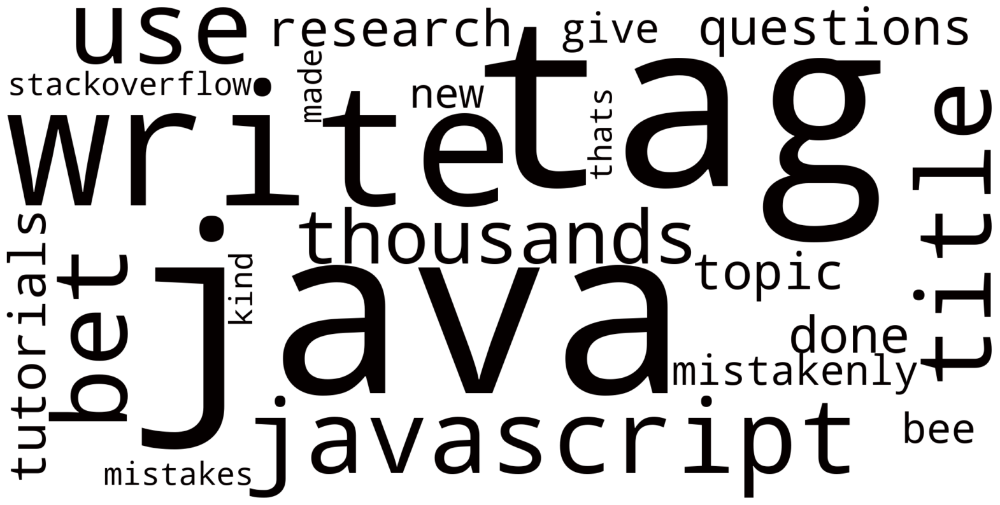

In [302]:
from wordcloud import WordCloud, STOPWORDS

warnings.filterwarnings('ignore')

def black_color_func(word, font_size, position,orientation,random_state=None, **kwargs):
    return("hsl(0,100%, 1%)")

cloud = WordCloud( background_color="white", width=2000, height=1000, max_words=500).generate(all_sentences)
cloud.recolor(color_func=black_color_func)
plt.figure(figsize=(20, 40))
plt.imshow(cloud, interpolation="bilinear")
plt.axis("off")
plt.show()

warnings.resetwarnings()

## 5. Sentiment Analysis

#### 5.1 Preparing the sentences

In [303]:
allCommentsGroupedCleanedSentDict = copy.deepcopy(allCommentsGroupedCleanedDict)

allCommentsGroupedCleanedSentDict = {k: v for k, v in allCommentsGroupedCleanedSentDict.items() if v['comments'] or v['answers'] or v['answer_comments']}
for key, value in allCommentsGroupedCleanedSentDict.items():
  del value['answers_cmts_joined']
  del value['answers_joined']
  del value['comments_joined']
  
  # make new key 
  value['all_sentences'] = []
  all_comments_arr = []
  all_answers_arr = []
  all_answer_cmts_arr = []
   
  for comment in value['comments']:
    if comment['comment']: 
      all_comments_arr.append(comment['comment'])
    
  for answer in value['answers']:
    if answer['answer']:
      all_answers_arr.append(answer['answer'])
    
  for answer_cmt in value['answer_comments']:
    if answer_cmt['answer_cmt']:
      all_answer_cmts_arr.append(answer_cmt['answer_cmt'])

  value['all_sentences'] =  all_comments_arr + all_answers_arr + all_answer_cmts_arr
  
  # sentence tokenization
  value['all_sentences'] = [sent_tokenize(sentence) for sentence in value['all_sentences']]
  # flatten 
  value['all_sentences'] = [item for sublist in value['all_sentences'] for item in sublist]

print(yaml.dump(allCommentsGroupedCleanedSentDict, allow_unicode=True, default_flow_style=False))

Add characters to a string in Javascript:
  all_sentences:
  - If list is an array, then don't use but a normal loop.
  - 'More information here: developer.mozilla.org/en/JavaScript/Reference/Statements/…
    Btw.'
  - if you look closely at both of your examples, you can see the difference ( vs
  - ' A better way might be to get the keys from the object instead of iterating (),
    and join on those: Blazes Feb 24, 2020 at 17:32'
  answer_comments:
  - answer_cmt: ' A better way might be to get the keys from the object instead of
      iterating (), and join on those: Blazes Feb 24, 2020 at 17:32 '
    datetime: Feb 24, 2020 at 17:32
    id: 1
    url:
    - !!python/tuple
      - /users/713026/blazes
      - Blazes
    - !!python/tuple
      - '#comment106813162_5754754'
      - '<span title="2020-02-24 17:32:23Z, License: CC BY-SA 4.0" class="relativetime-clean">Feb
        24, 2020 at 17:32</span>'
    votes: '1'
  answers:
  - answer: ' '
    datetime: '2020-02-24 17:32:23Z'
    i

##### 5.2 Scoring post with sentiment

In [304]:
tokenizer = AutoTokenizer.from_pretrained("cardiffnlp/twitter-roberta-base-sentiment-latest")
config = AutoConfig.from_pretrained("cardiffnlp/twitter-roberta-base-sentiment-latest")
model = AutoModelForSequenceClassification.from_pretrained("cardiffnlp/twitter-roberta-base-sentiment-latest")

allCommentsGroupedCleanedSentDict = copy.deepcopy(allCommentsGroupedCleanedSentDict)

for key, value in allCommentsGroupedCleanedSentDict.items():
  list_of_sentences = value['all_sentences']
  print('working on', key, 'with', len(list_of_sentences), 'sentences')
  print(yaml.dump(list_of_sentences, allow_unicode=True, default_flow_style=False))
  output = model(**tokenizer(list_of_sentences, padding=True, truncation=True, return_tensors="pt"))

  list_of_sentences_with_sentiment = []

  for j in range(len(list_of_sentences)):
    scores = output[0][j].detach().numpy()
    scores = softmax(scores)
    ranking = np.argsort(scores)
    ranking = ranking[::-1]
    for i in range(scores.shape[0]):
        l = config.id2label[ranking[i]]
        s = scores[ranking[i]]

        if(list_of_sentences[j] not in [ sentence['sentence'] for sentence in list_of_sentences_with_sentiment]):
          list_of_sentences_with_sentiment.append(
            {
              'sentence': list_of_sentences[j],
              l:  np.round(float(s), 4),
            }
          )
        else:
          index =  [ sentence['sentence'] for sentence in list_of_sentences_with_sentiment].index(list_of_sentences[j])
          list_of_sentences_with_sentiment[index][l] = np.round(float(s), 4)
        

  averagePositiveSentimentScore = sum([ sentence['positive'] for sentence in list_of_sentences_with_sentiment]) / len(list_of_sentences_with_sentiment)
  averageNegativeSentimentScore = sum([ sentence['negative'] for sentence in list_of_sentences_with_sentiment]) / len(list_of_sentences_with_sentiment)
  averageNeutralSentimentScore = sum([ sentence['neutral'] for sentence in list_of_sentences_with_sentiment]) / len(list_of_sentences_with_sentiment)
  
  value['all_sentences_with_sentiment'] = list_of_sentences_with_sentiment
  value['avg_positive_sentiment'] = averagePositiveSentimentScore
  value['avg_negative_sentiment'] = averageNegativeSentimentScore
  value['avg_neutral_sentiment'] = averageNeutralSentimentScore

print(yaml.dump(allCommentsGroupedCleanedSentDict, allow_unicode=True, default_flow_style=False))

Some weights of the model checkpoint at cardiffnlp/twitter-roberta-base-sentiment-latest were not used when initializing RobertaForSequenceClassification: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.


working on Convert date to string in JavaScript with 4 sentences
- you write javascript in the title, then use the java tag, why?
- Also I bet there are thousands of questions or tutorials about this topic, have
  you done any research?
- mistakenly i give that java tag.
- i am a new bee to stackoverflow thats why this kind of mistakes i made.

working on javascript date to string with 2 sentences
- 'have you looked at this previous one: stackoverflow.com/questions/610406/…'
- 'For reference, here is a definitive source: Javascript Date Object'

working on Javascript Convert Date Time string to Epoch with 21 sentences
- '?'
- Thanks Rocket, but that would give me April 12th and I want Dec 4th.
- Possible duplicate of Converting UTC string to epoch time in javascript
- uhhhh.... @cbm64 you mean .
- '...?'
- '@cbm64 Hi, I''m facing the same issue.'
- But in my case I only have date not time.
- New Date for mm/dd/yyyy is working, but I want to use dd/mm/yyyy .
- If it is new Date(dd/mm/yy

## 6. Rank Post

In [305]:
warnings.filterwarnings('ignore')

allCommentsSentiment = copy.deepcopy(allCommentsGroupedCleanedSentDict)

# sort by avg positive sentiment
allCommentsSentiment = {k: v for k, v in allCommentsSentiment.items() if v['avg_positive_sentiment'] or v['avg_negative_sentiment'] or v['avg_neutral_sentiment']}
allCommentsSentiment = {k: v for k, v in sorted(allCommentsSentiment.items(), key=lambda item: item[1]['avg_positive_sentiment'], reverse=True)}

ACS_df = pd.DataFrame()
for key, value in list(allCommentsSentiment.items()):
  row_data = {
    'title': key,
    'avg_positive_sentiment': value['avg_positive_sentiment'],
    'avg_negative_sentiment': value['avg_negative_sentiment'],
    'avg_neutral_sentiment': value['avg_neutral_sentiment'],
    'sentence_list': value['all_sentences']
  }

  ACS_df = pd.concat([ACS_df, pd.DataFrame([row_data])], ignore_index=True)

warnings.resetwarnings()

ACS_df = ACS_df.sort_values(by=['avg_positive_sentiment'], ascending=False)
display(ACS_df.head(10))

,title,avg_positive_sentiment,avg_negative_sentiment,avg_neutral_sentiment,sentence_list
0,How To Convert HTML to PDF using JavaScript,0.943100,0.005100,0.051700,"[Thank you for the help, My js working perfect..."
1,import a css file into a javascript to convert...,0.502250,0.010450,0.487350,[you could try using to get the file as text.s...
2,How to get JavaScript output as string in CefS...,0.483300,0.040950,0.475750,[EvaluateScriptAsync - take a careful look at....
3,JavaScript Unit Testing in Rails 3.1,0.479640,0.057510,0.462840,[teaspoon does pretty much what you\'re lookin...
4,Converting a string to a function in JavaScript,0.440040,0.049980,0.510000,[if you don\'t know the function name in advan...
5,JavaScript ES6 - count duplicates to an Array ...,0.417640,0.146580,0.435760,"[I described this link above, it's not what i'..."
6,String date to format in another type of forma...,0.403643,0.027214,0.569157,[convert to Date() and get the month date and ...
7,How can I compare two strings and replace matc...,0.367700,0.073210,0.559110,[Do you want the result to be JSX elements or ...
8,JavaScript - converting Date to UTC and removi...,0.366200,0.013267,0.620567,"[Please post what you have tried so far., Hi, ..."
9,Unable to convert bytes Uint8Array to string i...,0.364350,0.127383,0.508267,"[Those bytes are no text what did you expect?,..."


#### 6.1 Rank Post Result Analysis

In [306]:
import warnings
warnings.filterwarnings('ignore')

second_summary_filtered = ACS_df.head(10)

second_summary_filtered_df = pd.DataFrame(columns=['title', 'avg_positive_sentiment', 'avg_negative_sentiment', 'avg_neutral_sentiment' 'sentences_grouped'])
for index, row in second_summary_filtered.iterrows():
  sentences_grouped = []
  for sentence in row['sentence_list']:
    sentences_grouped.append(sentence)
      
    row_data = {
        'title': row['title'],
        'avg_positive_sentiment': row['avg_positive_sentiment'],
        'avg_negative_sentiment': row['avg_negative_sentiment'],
        'avg_neutral_sentiment': row['avg_neutral_sentiment'],
        'sentences_grouped': "".join(sentences_grouped)
    }

    second_summary_filtered_df = pd.concat([second_summary_filtered_df, pd.DataFrame([row_data])], ignore_index=True)

all_sentences = ""

for index, row in second_summary_filtered_df.iterrows():
  all_sentences += row['sentences_grouped']

warnings.resetwarnings()

print(len(all_sentences))

30942


#### 6.2 Plot Word Cloud

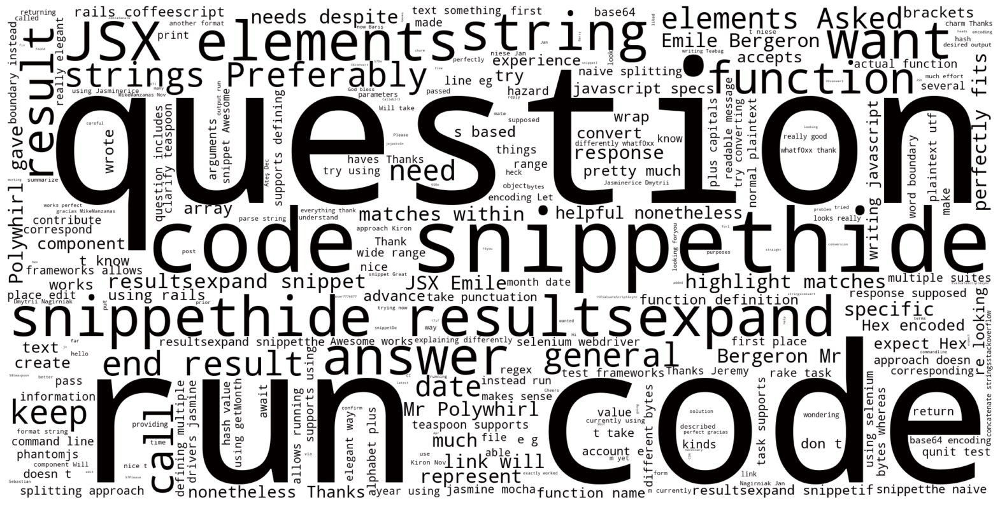

In [307]:
from wordcloud import WordCloud, STOPWORDS

warnings.filterwarnings('ignore')

def black_color_func(word, font_size, position,orientation,random_state=None, **kwargs):
    return("hsl(0,100%, 1%)")

cloud = WordCloud( background_color="white", width=2000, height=1000, max_words=500).generate(all_sentences)
cloud.recolor(color_func=black_color_func)
plt.figure(figsize=(20, 40))
plt.imshow(cloud, interpolation="bilinear")
plt.axis("off")
plt.show()

warnings.resetwarnings()

## 7. Summarize Top 5 

In [308]:
allCommentsSentimentSum = copy.deepcopy(allCommentsSentiment)
#only take top 5
allCommentsSentimentSum = {k: v for k, v in list(allCommentsSentimentSum.items())[:5]}

top_5_ACS_df = ACS_df.head(5)
display(top_5_ACS_df)

top_5_ACS_dict = top_5_ACS_df.to_dict('index')

print(top_5_ACS_dict)

,title,avg_positive_sentiment,avg_negative_sentiment,avg_neutral_sentiment,sentence_list
0,How To Convert HTML to PDF using JavaScript,0.94310,0.00510,0.05170,"[Thank you for the help, My js working perfect..."
1,import a css file into a javascript to convert...,0.50225,0.01045,0.48735,[you could try using to get the file as text.s...
2,How to get JavaScript output as string in CefS...,0.48330,0.04095,0.47575,[EvaluateScriptAsync - take a careful look at....
3,JavaScript Unit Testing in Rails 3.1,0.47964,0.05751,0.46284,[teaspoon does pretty much what you\'re lookin...
4,Converting a string to a function in JavaScript,0.44004,0.04998,0.51000,[if you don\'t know the function name in advan...


{0: {'title': 'How To Convert HTML to PDF using JavaScript', 'avg_positive_sentiment': 0.9431, 'avg_negative_sentiment': 0.0051, 'avg_neutral_sentiment': 0.0517, 'sentence_list': ['Thank you for the help, My js working perfectly only need the latest JavaScript CDN link.']}, 1: {'title': 'import a css file into a javascript to convert it to a string', 'avg_positive_sentiment': 0.50225, 'avg_negative_sentiment': 0.010450000000000001, 'avg_neutral_sentiment': 0.48735, 'sentence_list': ['you could try using to get the file as text.something like this:', 'you could try using to get the file as text.something like this:', ' works perfect, gracias MikeManzanas Nov 2, 2022 at 18:15', ' works perfect, gracias MikeManzanas Nov 2, 2022 at 18:15']}, 2: {'title': 'How to get JavaScript output as string in CefSharp?', 'avg_positive_sentiment': 0.4833, 'avg_negative_sentiment': 0.04095, 'avg_neutral_sentiment': 0.47575, 'sentence_list': ['EvaluateScriptAsync - take a careful look at.', 'Thank you I f

#### 7.1 Using BartLargeCNN by Hugging Face

In [309]:
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM

tokenizer = AutoTokenizer.from_pretrained("facebook/bart-large-cnn")
model = AutoModelForSeq2SeqLM.from_pretrained("facebook/bart-large-cnn")

top_5_ACS_dict_BART = copy.deepcopy(top_5_ACS_dict)

for key, value in top_5_ACS_dict_BART.items():
    print("Summarizing ", key)
    joined_sentence = ' '.join(value['sentence_list'])
    if len(joined_sentence) > 1024:
      joined_sentence = joined_sentence[:1020] 
    input_ids = tokenizer.encode(joined_sentence, return_tensors='pt')
    summary_ids = model.generate(input_ids)
    top_5_ACS_dict_BART[key]['summary'] = tokenizer.decode(summary_ids[0], skip_special_tokens=True)
    
print(yaml.dump(top_5_ACS_dict_BART, allow_unicode=True, default_flow_style=False))

Summarizing  0


C:\Users\User\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\transformers\generation\utils.py:1353: UserWarning: Using `max_length`'s default (142) to control the generation length. This behaviour is deprecated and will be removed from the config in v5 of Transformers -- we recommend using `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Summarizing  1
Summarizing  2
Summarizing  3
Summarizing  4
0:
  avg_negative_sentiment: 0.0051
  avg_neutral_sentiment: 0.0517
  avg_positive_sentiment: 0.9431
  sentence_list:
  - Thank you for the help, My js working perfectly only need the latest JavaScript
    CDN link.
  summary: My js working perfectly only need the latest JavaScript CDN link.Thank
    you for the help, My js is working perfectly. Only need theLatest CDN Link to
    get your site working. Thank you for all the help and support you've given us
    over the past few years.
  title: How To Convert HTML to PDF using JavaScript
1:
  avg_negative_sentiment: 0.010450000000000001
  avg_neutral_sentiment: 0.48735
  avg_positive_sentiment: 0.50225
  sentence_list:
  - 'you could try using to get the file as text.something like this:'
  - 'you could try using to get the file as text.something like this:'
  - ' works perfect, gracias MikeManzanas Nov 2, 2022 at 18:15'
  - ' works perfect, gracias MikeManzanas Nov 2, 2022 at

##### 7.1.1 Bart Large CNN Result Analysis

In [310]:
import warnings
warnings.filterwarnings('ignore')

third_summary_filtered = pd.DataFrame(top_5_ACS_dict_BART).T
display(third_summary_filtered)

all_sentences = ""
for index, row in third_summary_filtered.iterrows():
  all_sentences += row['summary']

warnings.resetwarnings()

print(len(all_sentences))

,title,avg_positive_sentiment,avg_negative_sentiment,avg_neutral_sentiment,sentence_list,summary
0,How To Convert HTML to PDF using JavaScript,0.9431,0.0051,0.0517,"[Thank you for the help, My js working perfect...",My js working perfectly only need the latest J...
1,import a css file into a javascript to convert...,0.50225,0.01045,0.48735,[you could try using to get the file as text.s...,you could try using to get the file as text.so...
2,How to get JavaScript output as string in CefS...,0.4833,0.04095,0.47575,[EvaluateScriptAsync - take a careful look at....,EvaluateScriptAsync - take a careful look at. ...
3,JavaScript Unit Testing in Rails 3.1,0.47964,0.05751,0.46284,[teaspoon does pretty much what you\'re lookin...,"teaspoon.i wrote most of it, and it’s based on..."
4,Converting a string to a function in JavaScript,0.44004,0.04998,0.51,[if you don\'t know the function name in advan...,if you don\'t know the function name in advanc...


1153


#### 7.1.2 Plot Word Cloud

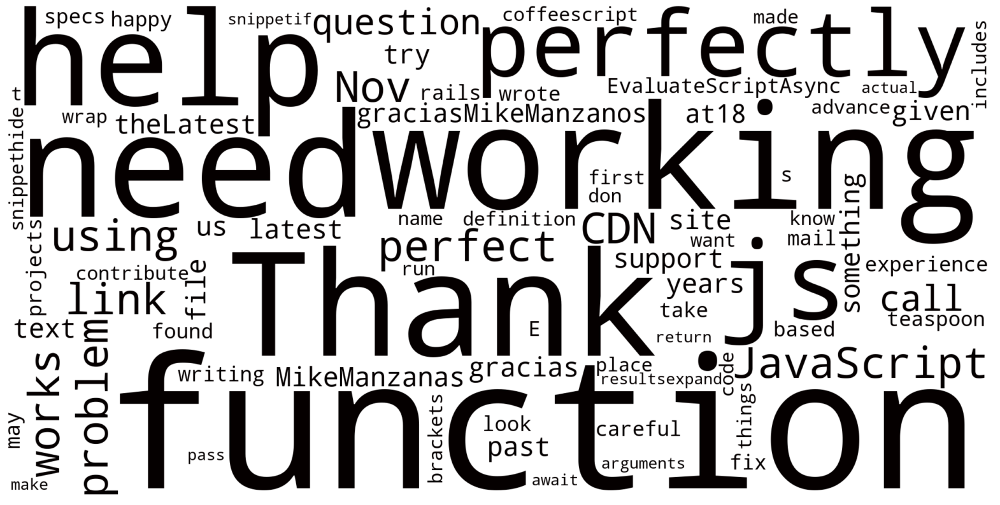

In [311]:
from wordcloud import WordCloud, STOPWORDS

warnings.filterwarnings('ignore')

def black_color_func(word, font_size, position,orientation,random_state=None, **kwargs):
    return("hsl(0,100%, 1%)")

cloud = WordCloud( background_color="white", width=2000, height=1000, max_words=500).generate(all_sentences)
cloud.recolor(color_func=black_color_func)
plt.figure(figsize=(20, 40))
plt.imshow(cloud, interpolation="bilinear")
plt.axis("off")
plt.show()

warnings.resetwarnings()

### 7.2 Pegasus-XSUM

In [312]:
from transformers import AutoTokenizer, AutoModelForSeq2SeqLM

tokenizer = AutoTokenizer.from_pretrained("google/pegasus-xsum")
model = AutoModelForSeq2SeqLM.from_pretrained("google/pegasus-xsum")

top_5_ACS_dict_PXSUM = copy.deepcopy(top_5_ACS_dict)

for key, value in top_5_ACS_dict_PXSUM.items():
    print("Summarizing ", key)
    joined_sentence = ' '.join(value['sentence_list'])
    if len(joined_sentence) > 1024:
      joined_sentence = joined_sentence[:1020] 
    input_ids = tokenizer.encode(joined_sentence, return_tensors='pt')
    summary_ids = model.generate(input_ids)
    top_5_ACS_dict_PXSUM[key]['summary'] = tokenizer.decode(summary_ids[0], skip_special_tokens=True)
    
print(yaml.dump(top_5_ACS_dict_PXSUM, allow_unicode=True, default_flow_style=False))

Summarizing  0


C:\Users\User\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\transformers\generation\utils.py:1353: UserWarning: Using `max_length`'s default (64) to control the generation length. This behaviour is deprecated and will be removed from the config in v5 of Transformers -- we recommend using `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Summarizing  1
Summarizing  2
Summarizing  3
Summarizing  4
0:
  avg_negative_sentiment: 0.0051
  avg_neutral_sentiment: 0.0517
  avg_positive_sentiment: 0.9431
  sentence_list:
  - Thank you for the help, My js working perfectly only need the latest JavaScript
    CDN link.
  summary: Can you tell me how I can get this to work?
  title: How To Convert HTML to PDF using JavaScript
1:
  avg_negative_sentiment: 0.010450000000000001
  avg_neutral_sentiment: 0.48735
  avg_positive_sentiment: 0.50225
  sentence_list:
  - 'you could try using to get the file as text.something like this:'
  - 'you could try using to get the file as text.something like this:'
  - ' works perfect, gracias MikeManzanas Nov 2, 2022 at 18:15'
  - ' works perfect, gracias MikeManzanas Nov 2, 2022 at 18:15'
  summary: gracias MikeManzanas
  title: import a css file into a javascript to convert it to a string
2:
  avg_negative_sentiment: 0.04095
  avg_neutral_sentiment: 0.47575
  avg_positive_sentiment: 0.4833
  sent

#### 7.2.1 Pegasus XSUM Result Analysis

In [313]:
import warnings
warnings.filterwarnings('ignore')

third_summary_filtered = pd.DataFrame(top_5_ACS_dict_PXSUM).T
display(third_summary_filtered)

all_sentences = ""
for index, row in third_summary_filtered.iterrows():
  all_sentences += row['summary']

warnings.resetwarnings()

print(len(all_sentences))

,title,avg_positive_sentiment,avg_negative_sentiment,avg_neutral_sentiment,sentence_list,summary
0,How To Convert HTML to PDF using JavaScript,0.9431,0.0051,0.0517,"[Thank you for the help, My js working perfect...",Can you tell me how I can get this to work?
1,import a css file into a javascript to convert...,0.50225,0.01045,0.48735,[you could try using to get the file as text.s...,gracias MikeManzanas
2,How to get JavaScript output as string in CefS...,0.4833,0.04095,0.47575,[EvaluateScriptAsync - take a careful look at....,Is there a fix for this?
3,JavaScript Unit Testing in Rails 3.1,0.47964,0.05751,0.46284,[teaspoon does pretty much what you\'re lookin...,Is there a wrapper around Teabag that lets me ...
4,Converting a string to a function in JavaScript,0.44004,0.04998,0.51,[if you don\'t know the function name in advan...,run code snippethide resultsexpand snippet


204


#### 7.2.2 Plot Word Cloud

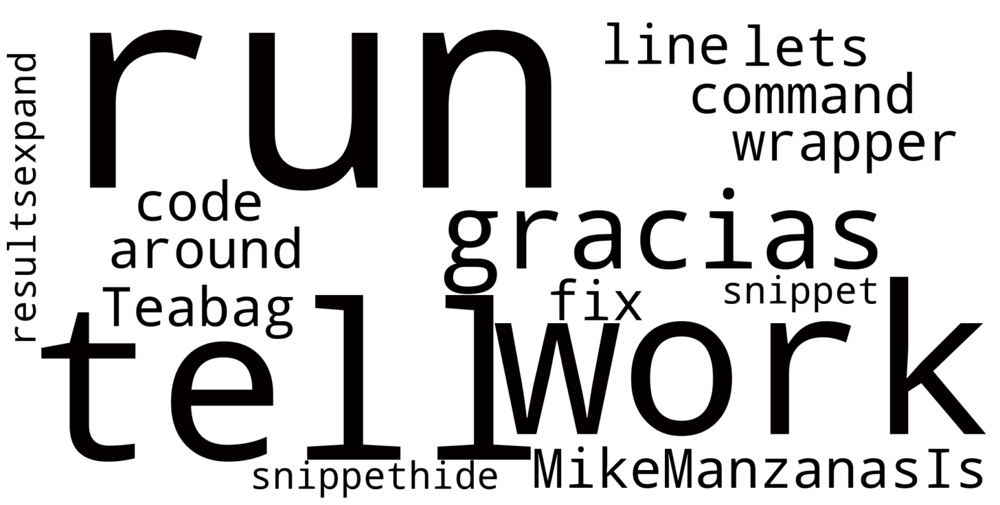

In [314]:
from wordcloud import WordCloud, STOPWORDS

warnings.filterwarnings('ignore')

def black_color_func(word, font_size, position,orientation,random_state=None, **kwargs):
    return("hsl(0,100%, 1%)")

cloud = WordCloud( background_color="white", width=2000, height=1000, max_words=500).generate(all_sentences)
cloud.recolor(color_func=black_color_func)
plt.figure(figsize=(20, 40))
plt.imshow(cloud, interpolation="bilinear")
plt.axis("off")
plt.show()

warnings.resetwarnings()

### 7.3 Comparing Both Deep Learning Models

##### We'll be comparing their summarized text based on a single question asked

In [315]:
pd.DataFrame(top_5_ACS_dict_PXSUM).T.to_csv('top_5_ACS_dict_PXSUM.csv')
pd.DataFrame(top_5_ACS_dict_BART).T.to_csv('top_5_ACS_dict_BART.csv')

In [316]:
pd.set_option('display.expand_frame_repr', False)

summary_compare_df = pd.DataFrame(top_5_ACS_dict_PXSUM).T['summary'].to_frame().join(pd.DataFrame(top_5_ACS_dict_BART).T['summary'].to_frame(), lsuffix='_pxsum', rsuffix='_bart')

for index, row in summary_compare_df.items():
  print("Summary for ", index)
  print("Pegasus XSUM: ", row['summary_pxsum'])
  print("BART CNN: ", row['summary_bart'])
  print("")
  
end_time = time.time()
print(end_time - start_time) # time in seconds

Summary for  summary_pxsum


KeyError: 'summary_pxsum'